# NBA COMPLEMENTARITY

In [1]:
# Load library

import pandas as pd

import numpy as np

import unidecode as dec

import nltk

import plotly.graph_objects as go

from PIL import Image

In [2]:
# Load Compatibility data

Comp = pd.read_excel("./data/Compatibility_Exercise_1.1.xlsx", sheet_name='NBA_Players_Stats')

Comp

,Player,FGM,FGA,FG%,3PM,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV
0,James Harden,9.9,22.3,44.4,4.4,12.4,35.5,10.2,11.8,86.5,1.0,5.5,6.6,7.5,1.8,0.9,4.5
1,Bradley Beal,10.4,22.9,45.5,3.0,8.4,35.3,6.8,8.0,84.2,0.9,3.3,4.2,6.1,1.2,0.4,3.4
2,Damian Lillard,9.5,20.4,46.3,4.1,10.2,40.1,7.0,7.8,88.8,0.5,3.8,4.3,8.0,1.1,0.3,2.9
3,Trae Young,9.1,20.8,43.7,3.4,9.5,36.1,8.0,9.3,86.0,0.5,3.7,4.3,9.3,1.1,0.1,4.8
4,Giannis Antetokounmpo,10.9,19.7,55.3,1.4,4.7,30.4,6.3,10.0,63.3,2.2,11.4,13.6,5.6,1.0,1.0,3.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256,Grant Williams,1.3,3.1,41.2,0.3,1.4,25.0,0.6,0.8,72.2,0.9,1.7,2.6,1.0,0.4,0.5,0.7
257,Semi Ojeleye,1.2,2.8,40.8,0.7,1.8,37.8,0.4,0.5,87.5,0.4,1.7,2.1,0.5,0.3,0.1,0.3
258,Rodney McGruder,1.3,3.2,39.8,0.4,1.6,27.0,0.3,0.6,55.9,0.5,2.2,2.7,0.6,0.5,0.1,0.4
259,Goga Bitadze,1.3,2.8,46.7,0.1,0.8,19.0,0.4,0.6,72.7,0.5,1.5,2.0,0.4,0.2,0.7,0.5


In [3]:
# Load Role data

Role = pd.read_csv("./data/NBA STATsR.csv", sep=';', decimal=",")

Role.drop_duplicates(subset = "Player", inplace = True)

Role = Role[['Player','Pos']].reset_index(drop = True)

for i in range(1,len(Role)):

    Role.loc[i,'Player'] = dec.unidecode(Role.loc[i,'Player']) # in order to remove all accented words which can cause some missing players during the merging of the dataframes
    
Role

,Player,Pos
0,A.J. Hammons,C
1,A.J. Price,PG
2,Aaron Brooks,PG
3,Aaron Gordon,PF
4,Aaron Gray,C
...,...,...
1282,Zhou Qi,PF
1283,Zion Williamson,PF
1284,Zoran Dragic,SG
1285,Zydrunas Ilgauskas,C


In [4]:
# Merge datasets in order to obtain the roles for each player

data = pd.merge(Comp, Role, on='Player')

data

,Player,FGM,FGA,FG%,3PM,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,Pos
0,James Harden,9.9,22.3,44.4,4.4,12.4,35.5,10.2,11.8,86.5,1.0,5.5,6.6,7.5,1.8,0.9,4.5,SG
1,Bradley Beal,10.4,22.9,45.5,3.0,8.4,35.3,6.8,8.0,84.2,0.9,3.3,4.2,6.1,1.2,0.4,3.4,SG
2,Damian Lillard,9.5,20.4,46.3,4.1,10.2,40.1,7.0,7.8,88.8,0.5,3.8,4.3,8.0,1.1,0.3,2.9,PG
3,Trae Young,9.1,20.8,43.7,3.4,9.5,36.1,8.0,9.3,86.0,0.5,3.7,4.3,9.3,1.1,0.1,4.8,PG
4,Giannis Antetokounmpo,10.9,19.7,55.3,1.4,4.7,30.4,6.3,10.0,63.3,2.2,11.4,13.6,5.6,1.0,1.0,3.7,PF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,Grant Williams,1.3,3.1,41.2,0.3,1.4,25.0,0.6,0.8,72.2,0.9,1.7,2.6,1.0,0.4,0.5,0.7,PF
248,Semi Ojeleye,1.2,2.8,40.8,0.7,1.8,37.8,0.4,0.5,87.5,0.4,1.7,2.1,0.5,0.3,0.1,0.3,PF
249,Rodney McGruder,1.3,3.2,39.8,0.4,1.6,27.0,0.3,0.6,55.9,0.5,2.2,2.7,0.6,0.5,0.1,0.4,SG
250,Goga Bitadze,1.3,2.8,46.7,0.1,0.8,19.0,0.4,0.6,72.7,0.5,1.5,2.0,0.4,0.2,0.7,0.5,C


In [5]:
# Find which players are missing after the merging of the dataframes

miss = []

players = list(data['Player'])

for i in Comp['Player']:
    
    if i not in players:
        
        miss.append(i)
        
miss

['Marcus Morris Sr.',
 'JJ Redick',
 'Danuel House Jr.',
 'Svi Mykhailiuk',
 'James Ennis III',
 'Kevin Knox II',
 'Lonnie Walker IV',
 'Juancho Hernangomez',
 'Wes Iwundu']

In [6]:
# Seach role for missing players

pos = []

score = 100

y = 0

for i in miss:
    
    for j in Role['Player']:
        
        x = nltk.edit_distance(i,j) # return how many char are different between i and j
        
        if x < score:
            
            score = x
            
        else:
            
            y += 1 # counter for index
            
    pos.append(Role.iloc[y,1])
    
    y = 0
    
    score = 100
    
pos

['PF', 'PF', 'C', 'SF', 'PF', 'SF', 'C', 'C', 'PF']

In [7]:
# Save stats and role for missing players in the merged dataframe

y = 0

for i in miss:
    
    x = Comp[Comp['Player']==i].squeeze()
    
    x.loc['Pos'] = pos[y]
    
    data.loc[len(data),:] = x
    
    y+=1

# Add stats for 2-point shots

data['2PA'] = data['FGA']-data['3PA']

data['2PM'] = data['FGM']-data['3PM']

data['2P%'] = data['2PM']/data['2PA']

data

,Player,FGM,FGA,FG%,3PM,3PA,3P%,FTM,FTA,FT%,...,DREB,REB,AST,STL,BLK,TOV,Pos,2PA,2PM,2P%
0,James Harden,9.9,22.3,44.4,4.4,12.4,35.5,10.2,11.8,86.5,...,5.5,6.6,7.5,1.8,0.9,4.5,SG,9.9,5.5,0.555556
1,Bradley Beal,10.4,22.9,45.5,3.0,8.4,35.3,6.8,8.0,84.2,...,3.3,4.2,6.1,1.2,0.4,3.4,SG,14.5,7.4,0.510345
2,Damian Lillard,9.5,20.4,46.3,4.1,10.2,40.1,7.0,7.8,88.8,...,3.8,4.3,8.0,1.1,0.3,2.9,PG,10.2,5.4,0.529412
3,Trae Young,9.1,20.8,43.7,3.4,9.5,36.1,8.0,9.3,86.0,...,3.7,4.3,9.3,1.1,0.1,4.8,PG,11.3,5.7,0.504425
4,Giannis Antetokounmpo,10.9,19.7,55.3,1.4,4.7,30.4,6.3,10.0,63.3,...,11.4,13.6,5.6,1.0,1.0,3.7,PF,15.0,9.5,0.633333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256,James Ennis III,2.3,5.2,44.6,0.8,2.4,32.5,1.1,1.4,80.6,...,2.5,3.6,0.9,0.5,0.3,0.8,PF,2.8,1.5,0.535714
257,Kevin Knox II,2.2,6.2,35.9,1.0,3.1,32.7,1.0,1.6,65.3,...,2.4,2.8,0.9,0.4,0.4,0.7,SF,3.1,1.2,0.387097
258,Lonnie Walker IV,2.5,5.9,42.6,0.7,1.7,40.6,0.7,1.0,72.1,...,1.9,2.3,1.1,0.5,0.2,0.7,C,4.2,1.8,0.428571
259,Juancho Hernangomez,2.1,5.1,40.5,0.9,2.7,34.1,0.9,1.5,62.0,...,3.2,4.1,0.8,0.4,0.2,0.7,C,2.4,1.2,0.500000


## POINT GUARD

In [8]:
# Point guard dataframe

PG = data[data['Pos']=='PG'][['Player','2PM','3PM','FTM','AST','OREB','DREB','STL','BLK']].copy().reset_index(drop=True)

PG

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK
0,Damian Lillard,5.4,4.1,7.0,8.0,0.5,3.8,1.1,0.3
1,Trae Young,5.7,3.4,8.0,9.3,0.5,3.7,1.1,0.1
2,Luka Doncic,6.7,2.8,7.0,8.8,1.3,8.1,1.0,0.2
3,Russell Westbrook,9.6,1.0,5.1,7.0,1.8,6.2,1.6,0.4
4,D'Angelo Russell,4.5,3.5,3.6,6.3,0.4,3.6,1.1,0.3
5,De'Aaron Fox,6.6,1.1,4.7,6.8,0.7,3.2,1.5,0.5
6,Collin Sexton,6.4,1.5,3.5,3.0,0.9,2.2,1.0,0.1
7,Spencer Dinwiddie,4.7,1.9,5.4,6.8,0.5,3.0,0.6,0.3
8,Kemba Walker,3.6,3.2,3.7,4.8,0.6,3.2,0.9,0.5
9,Kyle Lowry,3.0,2.8,5.1,7.5,0.6,4.5,1.4,0.4


In [9]:
# Max stats for each KPI

twopm = max(PG['2PM'])

threepm = max(PG['3PM'])

ftm = max(PG['FTM'])

ast = max(PG['AST'])

oreb = max(PG['OREB'])

dreb = max(PG['DREB'])

stl = max(PG['STL'])

blk = max(PG['BLK'])

In [10]:
# Evaluation of the quality of the pairs for each KPI (in percentage)

Pair = pd.DataFrame(np.zeros((1,9)),columns=PG.columns)

k = 0

fix = []

for i in range(len(PG)):
    
    for j in range(len(PG)):
        
        if (i != j) & (PG.loc[j,'Player'] not in fix): # in order to avoid pairs composed by the same player (i != j) and pairs already analyzed
            
            Pair.loc[k,'Player'] = '{x} + {y}'.format(x=PG.loc[i,'Player'],y=PG.loc[j,'Player']) # name of the pair
            
            Pair.loc[k,'2PM'] = max(PG.loc[i,'2PM'],PG.loc[j,'2PM'])/twopm
            
            Pair.loc[k,'3PM'] = max(PG.loc[i,'3PM'],PG.loc[j,'3PM'])/threepm
            
            Pair.loc[k,'FTM'] = max(PG.loc[i,'FTM'],PG.loc[j,'FTM'])/ftm
            
            Pair.loc[k,'AST'] = max(PG.loc[i,'AST'],PG.loc[j,'AST'])/ast
            
            Pair.loc[k,'OREB'] = max(PG.loc[i,'OREB'],PG.loc[j,'OREB'])/oreb
            
            Pair.loc[k,'DREB'] = max(PG.loc[i,'DREB'],PG.loc[j,'DREB'])/dreb
            
            Pair.loc[k,'STL'] = max(PG.loc[i,'STL'],PG.loc[j,'STL'])/stl
            
            Pair.loc[k,'BLK'] = max(PG.loc[i,'BLK'],PG.loc[j,'BLK'])/blk
            
            k += 1
            
    fix.append(PG.loc[i,'Player']) # save the player i in order to avoid pairs already analyzed
        

In [11]:
# Calculation of the complementarity percentage

Pair['Complementarity'] = (Pair['2PM']+Pair['3PM']+Pair['FTM']+Pair['AST']+Pair['OREB']+Pair['DREB']+Pair['STL']+Pair['BLK'])/8

Pair.sort_values(by='Complementarity',ascending=False, inplace=True)

Pair.reset_index(drop=True, inplace=True)

Pair

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK,Complementarity
0,Trae Young + Ben Simmons,0.687500,0.829268,1.0000,1.000000,1.00,0.716049,1.000000,0.857143,0.886245
1,Luka Doncic + Ben Simmons,0.697917,0.682927,0.8750,0.946237,1.00,1.000000,1.000000,0.857143,0.882403
2,Damian Lillard + Ben Simmons,0.687500,1.000000,0.8750,0.860215,1.00,0.716049,1.000000,0.857143,0.874488
3,Trae Young + Russell Westbrook,1.000000,0.829268,1.0000,1.000000,0.90,0.765432,0.761905,0.571429,0.853504
4,Luka Doncic + Russell Westbrook,1.000000,0.682927,0.8750,0.946237,0.90,1.000000,0.761905,0.571429,0.842187
...,...,...,...,...,...,...,...,...,...,...
1648,Raul Neto + Ryan Arcidiacono,0.135417,0.219512,0.0875,0.193548,0.15,0.197531,0.238095,0.142857,0.170558
1649,Raul Neto + Matthew Dellavedova,0.135417,0.146341,0.0875,0.344086,0.15,0.123457,0.190476,0.142857,0.165017
1650,Frank Jackson + Raul Neto,0.156250,0.195122,0.1125,0.193548,0.20,0.123457,0.190476,0.142857,0.164276
1651,Elie Okobo + Matthew Dellavedova,0.083333,0.121951,0.1125,0.344086,0.15,0.160494,0.190476,0.142857,0.163212



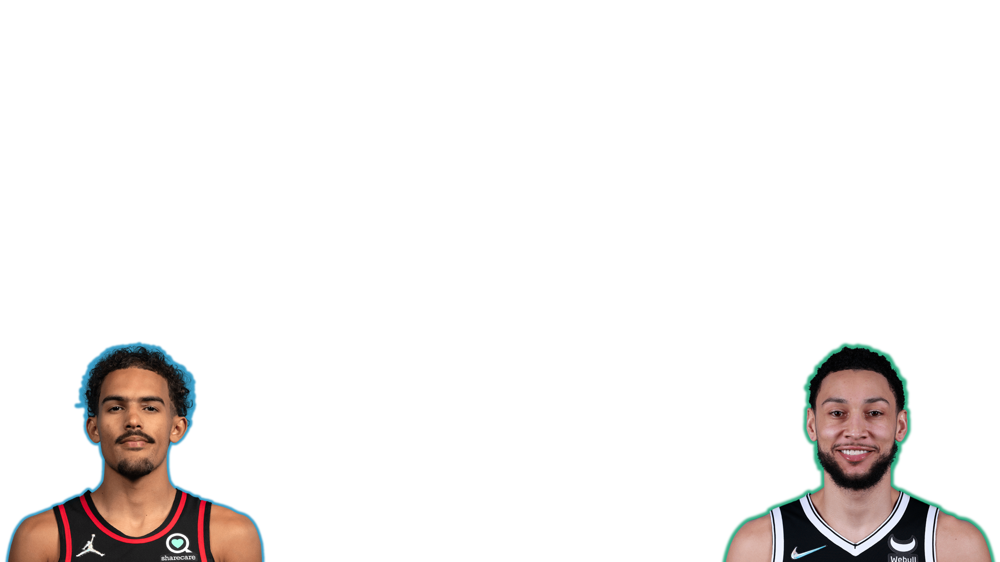

In [12]:
# Plot best pair for complementarity

categories = list(Pair.columns[1:9])

categories.append(categories[0]) # in order to close the line in the polar plot

range_twopm = twopm

range_threepm = threepm

range_ftm = ftm

range_ast = ast

range_oreb = oreb

range_dreb = dreb

range_stl = stl

range_blk = blk

ranges = [range_twopm,range_threepm,range_ftm,range_ast,range_oreb,range_dreb,range_stl,range_blk]

r1 = PG.loc[PG['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0]

r2 = PG.loc[PG['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0]

for idx, value in enumerate(ranges): # in order to standardize stats and obtain a more clear plot
    
    r1[idx] = r1[idx]/ranges[idx]
    
    r2[idx] = r2[idx]/ranges[idx]

r1.append(r1[0]) # in order to close the line in the polar plot

r2.append(r2[0]) # in order to close the line in the polar plot

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r = r1,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[0],
    line = dict(color = '#0a88bc',
                shape = 'spline'),
    line_smoothing = 0,
    hovertext = PG.loc[PG['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo = 'text',
    line_width=4,
    marker_size=8
))

fig.add_trace(go.Scatterpolar(
    r = r2,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[1],
    line = dict(color = '#019966',
                shape = 'spline'),
    line_smoothing=0,
    hovertext=PG.loc[PG['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo='text',
    line_width=4,
    marker_size=8
))

fig.update_polars(bgcolor='#1a3243',
                  angularaxis_gridcolor = 'rgba(0,0,0,0)',
                  angularaxis_linecolor = '#1b374b',
                  angularaxis_linewidth = 2,
                  angularaxis_tickfont_color = '#f1f2f2',
                  angularaxis_tickfont_size = 15,
                  angularaxis_tickfont_family = 'Arial')

fig.update_layout(
    title_text = 'Spider Chart - Stats-based indexes (Point Guard)',
    title_font_family = 'Arial',
    title_font_color = '#f1f2f2',
    title_font_size = 30,
    title_x = 0.5,
    legend_font_family = 'Arial',
    legend_font_size = 15,
    legend_font_color = '#f1f2f2',
    polar = dict(
        radialaxis=dict(
            visible=False)),
    showlegend = True,
    paper_bgcolor = '#181f2a',
    plot_bgcolor = '#181f2a',
    legend = dict(
    y = 1,
    x = 0.8
))

fig.update_xaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.update_yaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.add_layout_image(
    dict(
        source = Image.open('./data/PG.png'),
        xref = "x",
        yref = "y",
        x = 1.5,
        y = 3.5,
        sizex = 2,
        sizey = 7,
        opacity = 1,
        layer = "below")
)

fig.add_annotation(
    text = "Complementarity = {x}%".format(x=round(Pair.loc[0,'Complementarity']*100,2)),
    showarrow = False,
    font = dict(
        family = "Arial",
        size = 15,
        color = "#f1f2f2"
        ),
    align = "center",
    bordercolor = "#a38517",
    borderwidth = 4,
    borderpad = 4,
    opacity = 1,
    xshift = -325,
    yshift = 150
)

fig.show()

### The best pair is Trae Young and Ben Simmons with a complementarity equal to 88.62%. This means that if there were a hypothetical player with the best values in the KPIs analyzed in the role of point guard, this pair would be similar to him at  88.62%

## SHOOTING GUARD

In [13]:
# Shooting guard dataframe

SG = data[data['Pos']=='SG'][['Player','2PM','3PM','FTM','AST','OREB','DREB','STL','BLK']].copy().reset_index(drop=True)

SG

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK
0,James Harden,5.5,4.4,10.2,7.5,1.0,5.5,1.8,0.9
1,Bradley Beal,7.4,3.0,6.8,6.1,0.9,3.3,1.2,0.4
2,Devin Booker,7.0,2.0,6.7,6.5,0.4,3.8,0.7,0.3
3,Zach LaVine,5.9,3.1,4.5,4.2,0.7,4.1,1.5,0.5
4,Donovan Mitchell,6.2,2.5,4.0,4.3,0.8,3.6,1.0,0.2
5,CJ McCollum,5.9,2.8,2.0,4.4,0.7,3.6,0.8,0.6
6,Khris Middleton,5.2,2.4,3.4,4.3,0.7,5.5,0.9,0.1
7,Jaylen Brown,5.2,2.3,3.1,2.1,1.1,5.3,1.1,0.4
8,Buddy Hield,3.1,3.8,1.6,3.0,0.8,3.8,0.9,0.2
9,Jrue Holiday,5.5,2.0,2.1,6.7,1.3,3.5,1.6,0.8


In [14]:
# Max stats for each KPI

twopm = max(SG['2PM'])

threepm = max(SG['3PM'])

ftm = max(SG['FTM'])

ast = max(SG['AST'])

oreb = max(SG['OREB'])

dreb = max(SG['DREB'])

stl = max(SG['STL'])

blk = max(SG['BLK'])

In [15]:
# Evaluation of the quality of the pairs for each KPI (in percentage)

Pair = pd.DataFrame(np.zeros((1,9)),columns=SG.columns)

k = 0

fix = []

for i in range(len(SG)):
    
    for j in range(len(SG)):
        
        if (i != j) & (SG.loc[j,'Player'] not in fix): # in order to avoid pairs composed by the same player (i != j) and pairs already analyzed
            
            Pair.loc[k,'Player'] = '{x} + {y}'.format(x=SG.loc[i,'Player'],y=SG.loc[j,'Player']) # name of the pair
            
            Pair.loc[k,'2PM'] = max(SG.loc[i,'2PM'],SG.loc[j,'2PM'])/twopm
            
            Pair.loc[k,'3PM'] = max(SG.loc[i,'3PM'],SG.loc[j,'3PM'])/threepm
            
            Pair.loc[k,'FTM'] = max(SG.loc[i,'FTM'],SG.loc[j,'FTM'])/ftm
            
            Pair.loc[k,'AST'] = max(SG.loc[i,'AST'],SG.loc[j,'AST'])/ast
            
            Pair.loc[k,'OREB'] = max(SG.loc[i,'OREB'],SG.loc[j,'OREB'])/oreb
            
            Pair.loc[k,'DREB'] = max(SG.loc[i,'DREB'],SG.loc[j,'DREB'])/dreb
            
            Pair.loc[k,'STL'] = max(SG.loc[i,'STL'],SG.loc[j,'STL'])/stl
            
            Pair.loc[k,'BLK'] = max(SG.loc[i,'BLK'],SG.loc[j,'BLK'])/blk
            
            k += 1
            
    fix.append(SG.loc[i,'Player']) # save the player i in order to avoid pairs already analyzed
        

In [16]:
# Calculation of the complementarity percentage

Pair['Complementarity'] = (Pair['2PM']+Pair['3PM']+Pair['FTM']+Pair['AST']+Pair['OREB']+Pair['DREB']+Pair['STL']+Pair['BLK'])/8

Pair.sort_values(by='Complementarity',ascending=False, inplace=True)

Pair.reset_index(drop=True, inplace=True)

Pair

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK,Complementarity
0,James Harden + Josh Okogie,0.743243,1.000000,1.000000,1.000000,1.000000,0.982143,0.947368,1.000000,0.959094
1,James Harden + Bradley Beal,1.000000,1.000000,1.000000,1.000000,0.714286,0.982143,0.947368,1.000000,0.955475
2,James Harden + Jrue Holiday,0.743243,1.000000,1.000000,1.000000,0.928571,0.982143,0.947368,1.000000,0.950166
3,James Harden + Devin Booker,0.945946,1.000000,1.000000,1.000000,0.714286,0.982143,0.947368,1.000000,0.948718
4,James Harden + Tomas Satoransky,0.743243,1.000000,1.000000,1.000000,0.857143,0.982143,0.947368,1.000000,0.941237
...,...,...,...,...,...,...,...,...,...,...
1591,Anfernee Simons + Marco Belinelli,0.270270,0.272727,0.107843,0.186667,0.285714,0.321429,0.210526,0.111111,0.220786
1592,Damyean Dotson + Jerome Robinson,0.175676,0.272727,0.058824,0.186667,0.142857,0.321429,0.263158,0.333333,0.219334
1593,Kyle Korver + Marco Belinelli,0.135135,0.386364,0.078431,0.160000,0.214286,0.321429,0.210526,0.222222,0.216049
1594,Marco Belinelli + Jerome Robinson,0.135135,0.272727,0.078431,0.186667,0.142857,0.321429,0.210526,0.333333,0.210138


### The best pair would be James Harden and Josh Okogie with a complementarity percentage equal to 95.91%. Since Josh Okogie is a bench player, then the second pair (James Harden and Bradley Beal) is chosen as the most significative.


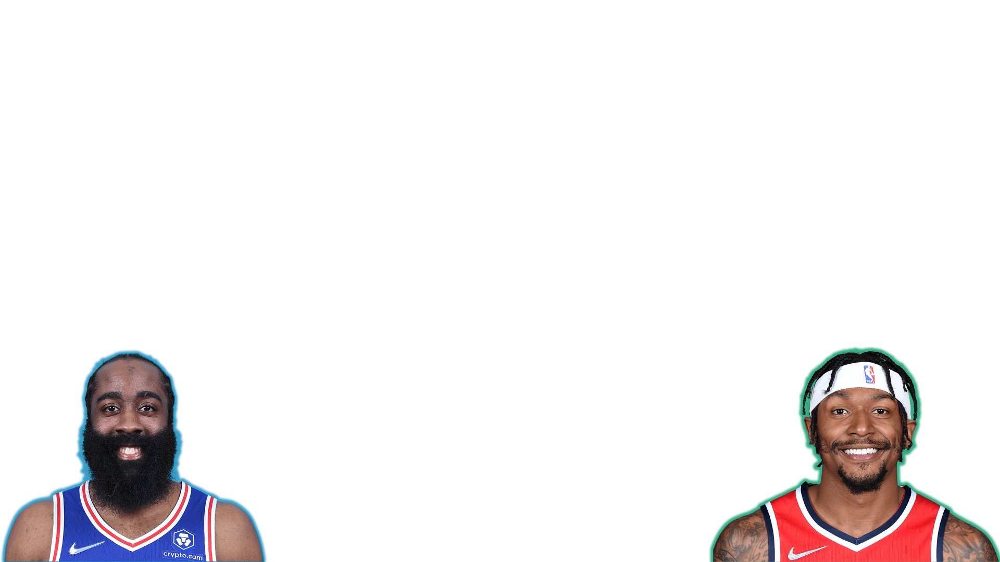

In [17]:
# Plot best pair for complementarity

categories = list(Pair.columns[1:9])

categories.append(categories[0]) # in order to close the line in the polar plot

range_twopm = twopm

range_threepm = threepm

range_ftm = ftm

range_ast = ast

range_oreb = oreb

range_dreb = dreb

range_stl = stl

range_blk = blk

ranges = [range_twopm,range_threepm,range_ftm,range_ast,range_oreb,range_dreb,range_stl,range_blk]

r1 = SG.loc[SG['Player']==Pair.loc[1,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0]

r2 = SG.loc[SG['Player']==Pair.loc[1,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0]

for idx, value in enumerate(ranges): # in order to standardize stats and obtain a more clear plot
    
    r1[idx] = r1[idx]/ranges[idx]
    
    r2[idx] = r2[idx]/ranges[idx]

r1.append(r1[0]) # in order to close the line in the polar plot

r2.append(r2[0]) # in order to close the line in the polar plot

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r = r1,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[1,'Player'].split(' + ')[0],
    line = dict(color = '#0a88bc',
                shape = 'spline'),
    line_smoothing = 0,
    hovertext = SG.loc[SG['Player']==Pair.loc[1,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo = 'text',
    line_width=4,
    marker_size=8
))

fig.add_trace(go.Scatterpolar(
    r = r2,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[1,'Player'].split(' + ')[1],
    line = dict(color = '#019966',
                shape = 'spline'),
    line_smoothing=0,
    hovertext=SG.loc[SG['Player']==Pair.loc[1,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo='text',
    line_width=4,
    marker_size=8
))

fig.update_polars(bgcolor='#1a3243',
                  angularaxis_gridcolor = 'rgba(0,0,0,0)',
                  angularaxis_linecolor = '#1b374b',
                  angularaxis_linewidth = 2,
                  angularaxis_tickfont_color = '#f1f2f2',
                  angularaxis_tickfont_size = 15,
                  angularaxis_tickfont_family = 'Arial')

fig.update_layout(
    title_text = 'Spider Chart - Stats-based indexes (Shooting Guard)',
    title_font_family = 'Arial',
    title_font_color = '#f1f2f2',
    title_font_size = 30,
    title_x = 0.5,
    legend_font_family = 'Arial',
    legend_font_size = 15,
    legend_font_color = '#f1f2f2',
    polar = dict(
        radialaxis=dict(
            visible=False)),
    showlegend = True,
    paper_bgcolor = '#181f2a',
    plot_bgcolor = '#181f2a',
    legend = dict(
    y = 1,
    x = 0.8
))

fig.update_xaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.update_yaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.add_layout_image(
    dict(
        source = Image.open('./data/SG.png'),
        xref = "x",
        yref = "y",
        x = 1.5,
        y = 3.5,
        sizex = 2,
        sizey = 7,
        opacity = 1,
        layer = "below")
)

fig.add_annotation(
    text = "Complementarity = {x}%".format(x=round(Pair.loc[1,'Complementarity']*100,2)),
    showarrow = False,
    font = dict(
        family = "Arial",
        size = 15,
        color = "#f1f2f2"
        ),
    align = "center",
    bordercolor = "#a38517",
    borderwidth = 4,
    borderpad = 4,
    opacity = 1,
    xshift = -325,
    yshift = 150
)

fig.show()

### The second best pair is James Harden and Bradley Beal with a complementarity equal to 95.55%. This means that if there were a hypothetical player with the best values in the KPIs analyzed in the role of shooting guard, this pair would be similar to him at 95.55%

## SMALL FORWARD

In [18]:
# Small forward dataframe

SF = data[data['Pos']=='SF'][['Player','2PM','3PM','FTM','AST','OREB','DREB','STL','BLK']].copy().reset_index(drop=True)

SF

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK
0,Kawhi Leonard,7.1,2.2,6.2,4.9,0.9,6.1,1.8,0.6
1,Brandon Ingram,5.8,2.4,5.0,4.2,0.8,5.3,1.0,0.6
2,DeMar DeRozan,8.1,0.1,5.6,5.6,0.6,4.9,1.0,0.3
3,Andrew Wiggins,6.0,2.1,3.5,3.7,1.2,3.9,0.8,1.0
4,Bojan Bogdanovic,3.6,3.0,4.0,2.1,0.6,3.5,0.5,0.1
5,Jimmy Butler,5.4,0.5,7.6,6.0,1.8,4.8,1.8,0.6
6,T.J. Warren,6.6,1.4,2.5,1.5,1.0,3.2,1.2,0.5
7,Danilo Gallinari,2.9,2.9,4.3,1.9,0.5,4.6,0.7,0.1
8,Kelly Oubre Jr.,4.8,1.9,3.4,1.5,1.2,5.3,1.3,0.7
9,Gordon Hayward,5.1,1.6,2.4,4.1,1.1,5.6,0.7,0.4


In [19]:
# Max stats for each KPI

twopm = max(SF['2PM'])

threepm = max(SF['3PM'])

ftm = max(SF['FTM'])

ast = max(SF['AST'])

oreb = max(SF['OREB'])

dreb = max(SF['DREB'])

stl = max(SF['STL'])

blk = max(SF['BLK'])

In [20]:
# Evaluation of the quality of the pairs for each KPI (in percentage)

Pair = pd.DataFrame(np.zeros((1,9)),columns=SF.columns)

k = 0

fix = []

for i in range(len(SF)):
    
    for j in range(len(SF)):
        
        if (i != j) & (SF.loc[j,'Player'] not in fix): # in order to avoid pairs composed by the same player (i != j) and pairs already analyzed
            
            Pair.loc[k,'Player'] = '{x} + {y}'.format(x=SF.loc[i,'Player'],y=SF.loc[j,'Player']) # name of the pair
            
            Pair.loc[k,'2PM'] = max(SF.loc[i,'2PM'],SF.loc[j,'2PM'])/twopm
            
            Pair.loc[k,'3PM'] = max(SF.loc[i,'3PM'],SF.loc[j,'3PM'])/threepm
            
            Pair.loc[k,'FTM'] = max(SF.loc[i,'FTM'],SF.loc[j,'FTM'])/ftm
            
            Pair.loc[k,'AST'] = max(SF.loc[i,'AST'],SF.loc[j,'AST'])/ast
            
            Pair.loc[k,'OREB'] = max(SF.loc[i,'OREB'],SF.loc[j,'OREB'])/oreb
            
            Pair.loc[k,'DREB'] = max(SF.loc[i,'DREB'],SF.loc[j,'DREB'])/dreb
            
            Pair.loc[k,'STL'] = max(SF.loc[i,'STL'],SF.loc[j,'STL'])/stl
            
            Pair.loc[k,'BLK'] = max(SF.loc[i,'BLK'],SF.loc[j,'BLK'])/blk
            
            k += 1
            
    fix.append(SF.loc[i,'Player']) # save the player i in order to avoid pairs already analyzed
        

In [21]:
# Calculation of the complementarity percentage

Pair['Complementarity'] = (Pair['2PM']+Pair['3PM']+Pair['FTM']+Pair['AST']+Pair['OREB']+Pair['DREB']+Pair['STL']+Pair['BLK'])/8

Pair.sort_values(by='Complementarity',ascending=False, inplace=True)

Pair.reset_index(drop=True, inplace=True)

Pair

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK,Complementarity
0,Andrew Wiggins + Jimmy Butler,0.740741,0.700000,1.000000,1.000000,1.000000,0.786885,1.000000,1.0,0.903453
1,Kawhi Leonard + Jimmy Butler,0.876543,0.733333,1.000000,1.000000,1.000000,1.000000,1.000000,0.6,0.901235
2,Bojan Bogdanovic + Jimmy Butler,0.666667,1.000000,1.000000,1.000000,1.000000,0.786885,1.000000,0.6,0.881694
3,Jimmy Butler + Danilo Gallinari,0.666667,0.966667,1.000000,1.000000,1.000000,0.786885,1.000000,0.6,0.877527
4,Brandon Ingram + Jimmy Butler,0.716049,0.800000,1.000000,1.000000,1.000000,0.868852,1.000000,0.6,0.873113
...,...,...,...,...,...,...,...,...,...,...
1123,Abdel Nader + Kevin Knox II,0.160494,0.333333,0.131579,0.150000,0.222222,0.393443,0.222222,0.4,0.251662
1124,Sterling Brown + Anthony Tolliver,0.123457,0.300000,0.078947,0.166667,0.333333,0.475410,0.333333,0.2,0.251393
1125,Treveon Graham + Anthony Tolliver,0.123457,0.300000,0.092105,0.133333,0.500000,0.360656,0.222222,0.2,0.241472
1126,Abdel Nader + Terrance Ferguson,0.160494,0.300000,0.118421,0.150000,0.222222,0.262295,0.277778,0.4,0.236401



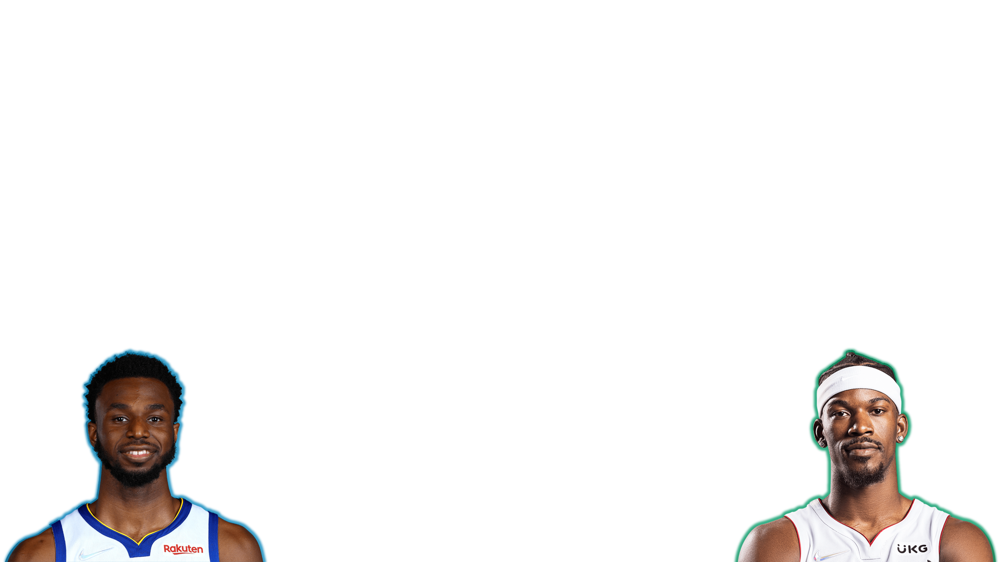

In [22]:
# Plot best pair for complementarity

categories = list(Pair.columns[1:9])

categories.append(categories[0]) # in order to close the line in the polar plot

range_twopm = twopm

range_threepm = threepm

range_ftm = ftm

range_ast = ast

range_oreb = oreb

range_dreb = dreb

range_stl = stl

range_blk = blk

ranges = [range_twopm,range_threepm,range_ftm,range_ast,range_oreb,range_dreb,range_stl,range_blk]

r1 = SF.loc[SF['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0]

r2 = SF.loc[SF['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0]

for idx, value in enumerate(ranges): # in order to standardize stats and obtain a more clear plot
    
    r1[idx] = r1[idx]/ranges[idx]
    
    r2[idx] = r2[idx]/ranges[idx]

r1.append(r1[0]) # in order to close the line in the polar plot

r2.append(r2[0]) # in order to close the line in the polar plot

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r = r1,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[0],
    line = dict(color = '#0a88bc',
                shape = 'spline'),
    line_smoothing = 0,
    hovertext = SF.loc[SF['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo = 'text',
    line_width=4,
    marker_size=8
))

fig.add_trace(go.Scatterpolar(
    r = r2,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[1],
    line = dict(color = '#019966',
                shape = 'spline'),
    line_smoothing=0,
    hovertext=SF.loc[SF['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo='text',
    line_width=4,
    marker_size=8
))

fig.update_polars(bgcolor='#1a3243',
                  angularaxis_gridcolor = 'rgba(0,0,0,0)',
                  angularaxis_linecolor = '#1b374b',
                  angularaxis_linewidth = 2,
                  angularaxis_tickfont_color = '#f1f2f2',
                  angularaxis_tickfont_size = 15,
                  angularaxis_tickfont_family = 'Arial')

fig.update_layout(
    title_text = 'Spider Chart - Stats-based indexes (Small Forward)',
    title_font_family = 'Arial',
    title_font_color = '#f1f2f2',
    title_font_size = 30,
    title_x = 0.5,
    legend_font_family = 'Arial',
    legend_font_size = 15,
    legend_font_color = '#f1f2f2',
    polar = dict(
        radialaxis=dict(
            visible=False)),
    showlegend = True,
    paper_bgcolor = '#181f2a',
    plot_bgcolor = '#181f2a',
    legend = dict(
    y = 1,
    x = 0.8
))

fig.update_xaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.update_yaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.add_layout_image(
    dict(
        source = Image.open('./data/SF.png'),
        xref = "x",
        yref = "y",
        x = 1.5,
        y = 3.5,
        sizex = 2,
        sizey = 7,
        opacity = 1,
        layer = "below")
)

fig.add_annotation(
    text = "Complementarity = {x}%".format(x=round(Pair.loc[0,'Complementarity']*100,2)),
    showarrow = False,
    font = dict(
        family = "Arial",
        size = 15,
        color = "#f1f2f2"
        ),
    align = "center",
    bordercolor = "#a38517",
    borderwidth = 4,
    borderpad = 4,
    opacity = 1,
    xshift = -325,
    yshift = 150
)

fig.show()

### The best pair is Andrew Wiggins and Jimmy Butler with a complementarity equal to 90.35%. This means that if there were a hypothetical player with the best values in the KPIs analyzed in the role of small forward, this pair would be similar to him at 90.35%

## POWER FORWARD

In [23]:
# Power forward dataframe

PF = data[data['Pos']=='PF'][['Player','2PM','3PM','FTM','AST','OREB','DREB','STL','BLK']].copy().reset_index(drop=True)

PF

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK
0,Giannis Antetokounmpo,9.5,1.4,6.3,5.6,2.2,11.4,1.0,1.0
1,Anthony Davis,7.7,1.2,7.2,3.2,2.3,7.0,1.5,2.3
2,LeBron James,7.4,2.2,3.9,10.2,1.0,6.9,1.2,0.5
3,Jayson Tatum,5.5,2.9,3.8,3.0,1.0,6.0,1.4,0.9
4,Pascal Siakam,6.1,2.2,4.0,3.5,1.1,6.3,1.0,0.9
5,Tobias Harris,5.9,1.8,2.4,3.2,1.0,5.9,0.7,0.6
6,LaMarcus Aldridge,6.2,1.2,3.0,2.4,1.9,5.5,0.7,1.6
7,Domantas Sabonis,7.1,0.3,3.5,5.0,3.0,9.4,0.8,0.5
8,Kevin Love,3.2,2.6,3.3,3.2,1.0,8.8,0.6,0.3
9,Bam Adebayo,6.1,0.0,3.7,5.1,2.4,7.8,1.1,1.3


In [24]:
# Max stats for each KPI

twopm = max(PF['2PM'])

threepm = max(PF['3PM'])

ftm = max(PF['FTM'])

ast = max(PF['AST'])

oreb = max(PF['OREB'])

dreb = max(PF['DREB'])

stl = max(PF['STL'])

blk = max(PF['BLK'])

In [25]:
# Evaluation of the quality of the pairs for each KPI (in percentage)

Pair = pd.DataFrame(np.zeros((1,9)),columns=PF.columns)

k = 0

fix = []

for i in range(len(PF)):
    
    for j in range(len(PF)):
        
        if (i != j) & (PF.loc[j,'Player'] not in fix): # in order to avoid pairs composed by the same player (i != j) and pairs already analyzed
            
            Pair.loc[k,'Player'] = '{x} + {y}'.format(x=PF.loc[i,'Player'],y=PF.loc[j,'Player']) # name of the pair
            
            Pair.loc[k,'2PM'] = max(PF.loc[i,'2PM'],PF.loc[j,'2PM'])/twopm
            
            Pair.loc[k,'3PM'] = max(PF.loc[i,'3PM'],PF.loc[j,'3PM'])/threepm
            
            Pair.loc[k,'FTM'] = max(PF.loc[i,'FTM'],PF.loc[j,'FTM'])/ftm
            
            Pair.loc[k,'AST'] = max(PF.loc[i,'AST'],PF.loc[j,'AST'])/ast
            
            Pair.loc[k,'OREB'] = max(PF.loc[i,'OREB'],PF.loc[j,'OREB'])/oreb
            
            Pair.loc[k,'DREB'] = max(PF.loc[i,'DREB'],PF.loc[j,'DREB'])/dreb
            
            Pair.loc[k,'STL'] = max(PF.loc[i,'STL'],PF.loc[j,'STL'])/stl
            
            Pair.loc[k,'BLK'] = max(PF.loc[i,'BLK'],PF.loc[j,'BLK'])/blk
            
            k += 1
            
    fix.append(PF.loc[i,'Player']) # save the player i in order to avoid pairs already analyzed
        

In [26]:
# Calculation of the complementarity percentage

Pair['Complementarity'] = (Pair['2PM']+Pair['3PM']+Pair['FTM']+Pair['AST']+Pair['OREB']+Pair['DREB']+Pair['STL']+Pair['BLK'])/8

Pair.sort_values(by='Complementarity',ascending=False, inplace=True)

Pair.reset_index(drop=True, inplace=True)

Pair

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK,Complementarity
0,Anthony Davis + LeBron James,0.810526,0.594595,1.000000,1.000000,0.575,0.614035,1.000000,1.000000,0.824269
1,Giannis Antetokounmpo + Anthony Davis,1.000000,0.378378,1.000000,0.549020,0.575,1.000000,1.000000,1.000000,0.812800
2,Anthony Davis + Davis Bertans,0.810526,1.000000,1.000000,0.313725,0.575,0.614035,1.000000,1.000000,0.789161
3,Giannis Antetokounmpo + LeBron James,1.000000,0.594595,0.875000,1.000000,0.550,1.000000,0.800000,0.434783,0.781797
4,Anthony Davis + Domantas Sabonis,0.810526,0.324324,1.000000,0.490196,0.750,0.824561,1.000000,1.000000,0.774951
...,...,...,...,...,...,...,...,...,...,...
1426,Georges Niang + Patrick Patterson,0.073684,0.378378,0.083333,0.068627,0.150,0.175439,0.200000,0.043478,0.146618
1427,Justin Jackson + Patrick Patterson,0.147368,0.297297,0.083333,0.078431,0.150,0.175439,0.133333,0.086957,0.144020
1428,Patrick Patterson + Semi Ojeleye,0.052632,0.297297,0.083333,0.068627,0.150,0.175439,0.200000,0.043478,0.133851
1429,Georges Niang + Semi Ojeleye,0.073684,0.378378,0.055556,0.068627,0.100,0.149123,0.200000,0.043478,0.133606



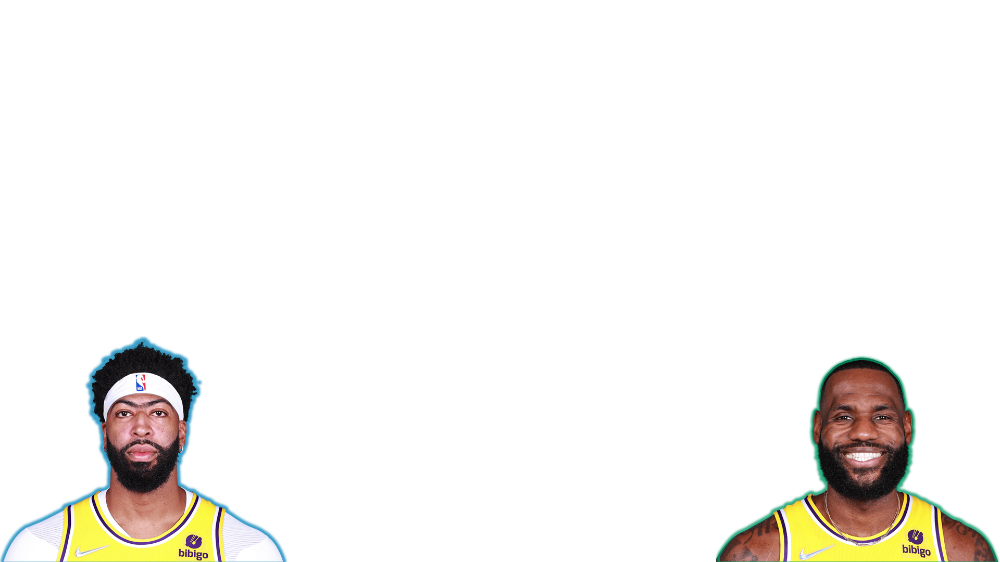

In [27]:
# Plot best pair for complementarity

categories = list(Pair.columns[1:9])

categories.append(categories[0]) # in order to close the line in the polar plot

range_twopm = twopm

range_threepm = threepm

range_ftm = ftm

range_ast = ast

range_oreb = oreb

range_dreb = dreb

range_stl = stl

range_blk = blk

ranges = [range_twopm,range_threepm,range_ftm,range_ast,range_oreb,range_dreb,range_stl,range_blk]

r1 = PF.loc[PF['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0]

r2 = PF.loc[PF['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0]

for idx, value in enumerate(ranges): # in order to standardize stats and obtain a more clear plot
    
    r1[idx] = r1[idx]/ranges[idx]
    
    r2[idx] = r2[idx]/ranges[idx]

r1.append(r1[0]) # in order to close the line in the polar plot

r2.append(r2[0]) # in order to close the line in the polar plot

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r = r1,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[0],
    line = dict(color = '#0a88bc',
                shape = 'spline'),
    line_smoothing = 0,
    hovertext = PF.loc[PF['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo = 'text',
    line_width=4,
    marker_size=8
))

fig.add_trace(go.Scatterpolar(
    r = r2,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[1],
    line = dict(color = '#019966',
                shape = 'spline'),
    line_smoothing=0,
    hovertext=PF.loc[PF['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo='text',
    line_width=4,
    marker_size=8
))

fig.update_polars(bgcolor='#1a3243',
                  angularaxis_gridcolor = 'rgba(0,0,0,0)',
                  angularaxis_linecolor = '#1b374b',
                  angularaxis_linewidth = 2,
                  angularaxis_tickfont_color = '#f1f2f2',
                  angularaxis_tickfont_size = 15,
                  angularaxis_tickfont_family = 'Arial')

fig.update_layout(
    title_text = 'Spider Chart - Stats-based indexes (Power Forward)',
    title_font_family = 'Arial',
    title_font_color = '#f1f2f2',
    title_font_size = 30,
    title_x = 0.5,
    legend_font_family = 'Arial',
    legend_font_size = 15,
    legend_font_color = '#f1f2f2',
    polar = dict(
        radialaxis=dict(
            visible=False)),
    showlegend = True,
    paper_bgcolor = '#181f2a',
    plot_bgcolor = '#181f2a',
    legend = dict(
    y = 1,
    x = 0.8
))

fig.update_xaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.update_yaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.add_layout_image(
    dict(
        source = Image.open('./data/PF.png'),
        xref = "x",
        yref = "y",
        x = 1.5,
        y = 3.5,
        sizex = 2,
        sizey = 7,
        opacity = 1,
        layer = "below")
)

fig.add_annotation(
    text = "Complementarity = {x}%".format(x=round(Pair.loc[0,'Complementarity']*100,2)),
    showarrow = False,
    font = dict(
        family = "Arial",
        size = 15,
        color = "#f1f2f2"
        ),
    align = "center",
    bordercolor = "#a38517",
    borderwidth = 4,
    borderpad = 4,
    opacity = 1,
    xshift = -325,
    yshift = 150
)

fig.show()

### The best pair is Anthony Davis and LeBron James with a complementarity equal to 82.43%. This means that if there were a hypothetical player with the best values in the KPIs analyzed in the role of power forward, this pair would be similar to him at 82.43%

## CENTER

In [28]:
# Center dataframe

C = data[data['Pos']=='C'][['Player','2PM','3PM','FTM','AST','OREB','DREB','STL','BLK']].copy().reset_index(drop=True)

C

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK
0,Kristaps Porzingis,4.5,2.5,4.0,1.8,1.8,7.7,0.7,2.0
1,Nikola Jokic,6.6,1.1,3.4,7.0,2.3,7.5,1.2,0.6
2,Nikola Vucevic,6.4,1.6,2.1,3.6,2.3,8.6,0.9,0.8
3,Julius Randle,6.2,1.0,4.0,3.1,2.4,7.4,0.8,0.3
4,Montrezl Harrell,7.5,0.0,3.7,1.7,2.6,4.5,0.6,1.1
5,Andre Drummond,7.2,0.1,3.0,2.7,4.4,10.8,1.9,1.6
6,Jaren Jackson Jr.,3.7,2.5,2.4,1.4,1.0,3.6,0.7,1.6
7,Hassan Whiteside,6.4,0.1,2.4,1.2,3.9,9.7,0.4,2.9
8,Rudy Gobert,5.7,0.0,3.7,1.5,3.4,10.1,0.8,2.0
9,Jonas Valanciunas,5.7,0.5,2.1,1.9,3.0,8.2,0.4,1.1


In [29]:
# Max stats for each KPI

twopm = max(C['2PM'])

threepm = max(C['3PM'])

ftm = max(C['FTM'])

ast = max(C['AST'])

oreb = max(C['OREB'])

dreb = max(C['DREB'])

stl = max(C['STL'])

blk = max(C['BLK'])

In [30]:
# Evaluation of the quality of the pairs for each KPI (in percentage)

Pair = pd.DataFrame(np.zeros((1,9)),columns=C.columns)

k = 0

fix = []

for i in range(len(C)):
    
    for j in range(len(C)):
        
        if (i != j) & (C.loc[j,'Player'] not in fix): # in order to avoid pairs composed by the same player (i != j) and pairs already analyzed
            
            Pair.loc[k,'Player'] = '{x} + {y}'.format(x=C.loc[i,'Player'],y=C.loc[j,'Player']) # name of the pair
            
            Pair.loc[k,'2PM'] = max(C.loc[i,'2PM'],C.loc[j,'2PM'])/twopm
            
            Pair.loc[k,'3PM'] = max(C.loc[i,'3PM'],C.loc[j,'3PM'])/threepm
            
            Pair.loc[k,'FTM'] = max(C.loc[i,'FTM'],C.loc[j,'FTM'])/ftm
            
            Pair.loc[k,'AST'] = max(C.loc[i,'AST'],C.loc[j,'AST'])/ast
            
            Pair.loc[k,'OREB'] = max(C.loc[i,'OREB'],C.loc[j,'OREB'])/oreb
            
            Pair.loc[k,'DREB'] = max(C.loc[i,'DREB'],C.loc[j,'DREB'])/dreb
            
            Pair.loc[k,'STL'] = max(C.loc[i,'STL'],C.loc[j,'STL'])/stl
            
            Pair.loc[k,'BLK'] = max(C.loc[i,'BLK'],C.loc[j,'BLK'])/blk
            
            k += 1
            
    fix.append(C.loc[i,'Player']) # save the player i in order to avoid pairs already analyzed
        

In [31]:
# Calculation of the complementarity percentage

Pair['Complementarity'] = (Pair['2PM']+Pair['3PM']+Pair['FTM']+Pair['AST']+Pair['OREB']+Pair['DREB']+Pair['STL']+Pair['BLK'])/8

Pair.sort_values(by='Complementarity',ascending=False, inplace=True)

Pair.reset_index(drop=True, inplace=True)

Pair

,Player,2PM,3PM,FTM,AST,OREB,DREB,STL,BLK,Complementarity
0,Kristaps Porzingis + Andre Drummond,0.960000,1.00,1.000,0.385714,1.000000,1.000000,1.000000,0.689655,0.879421
1,Nikola Jokic + Andre Drummond,0.960000,0.44,0.850,1.000000,1.000000,1.000000,1.000000,0.551724,0.850216
2,Andre Drummond + Jaren Jackson Jr.,0.960000,1.00,0.750,0.385714,1.000000,1.000000,1.000000,0.551724,0.830930
3,Nikola Jokic + Hassan Whiteside,0.880000,0.44,0.850,1.000000,0.886364,0.898148,0.631579,1.000000,0.823261
4,Andre Drummond + Robert Covington,0.960000,0.92,0.750,0.385714,1.000000,1.000000,1.000000,0.551724,0.820930
...,...,...,...,...,...,...,...,...,...,...
941,Robin Lopez + Bruno Fernando,0.226667,0.20,0.125,0.128571,0.272727,0.212963,0.157895,0.241379,0.195650
942,Thon Maker + Goga Bitadze,0.160000,0.16,0.300,0.100000,0.204545,0.175926,0.210526,0.241379,0.194047
943,Tony Bradley + Goga Bitadze,0.280000,0.04,0.125,0.057143,0.431818,0.250000,0.105263,0.241379,0.191325
944,Bruno Fernando + Goga Bitadze,0.226667,0.04,0.125,0.128571,0.272727,0.212963,0.157895,0.241379,0.175650



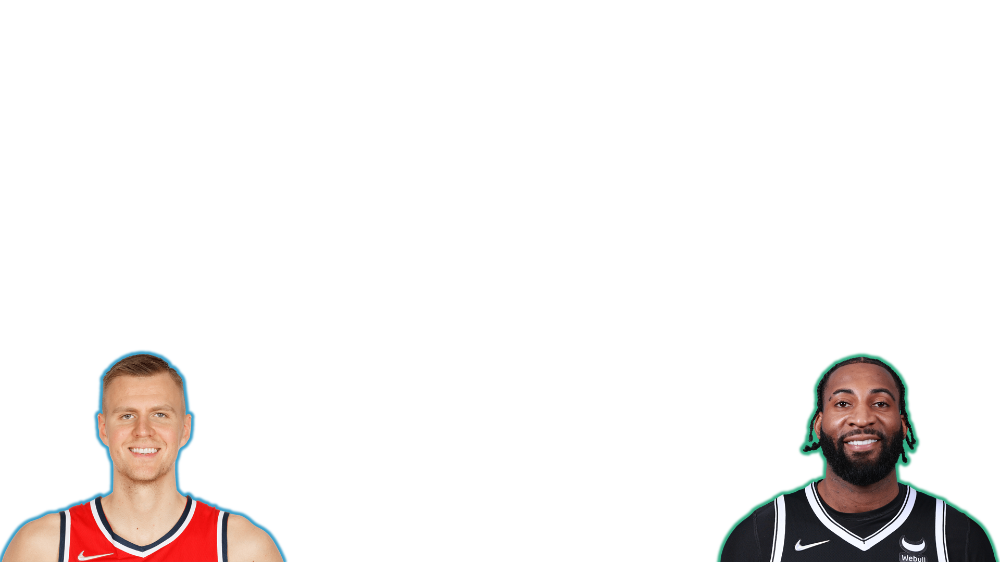

In [32]:
# Plot best pair for complementarity

categories = list(Pair.columns[1:9])

categories.append(categories[0]) # in order to close the line in the polar plot

range_twopm = twopm

range_threepm = threepm

range_ftm = ftm

range_ast = ast

range_oreb = oreb

range_dreb = dreb

range_stl = stl

range_blk = blk

ranges = [range_twopm,range_threepm,range_ftm,range_ast,range_oreb,range_dreb,range_stl,range_blk]

r1 = C.loc[C['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0]

r2 = C.loc[C['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0]

for idx, value in enumerate(ranges): # in order to standardize stats and obtain a more clear plot
    
    r1[idx] = r1[idx]/ranges[idx]
    
    r2[idx] = r2[idx]/ranges[idx]

r1.append(r1[0]) # in order to close the line in the polar plot

r2.append(r2[0]) # in order to close the line in the polar plot

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r = r1,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[0],
    line = dict(color = '#0a88bc',
                shape = 'spline'),
    line_smoothing = 0,
    hovertext = C.loc[C['Player']==Pair.loc[0,'Player'].split(' + ')[0],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo = 'text',
    line_width=4,
    marker_size=8
))

fig.add_trace(go.Scatterpolar(
    r = r2,
    theta = categories,
    fill = 'toself',
    name = Pair.loc[0,'Player'].split(' + ')[1],
    line = dict(color = '#019966',
                shape = 'spline'),
    line_smoothing=0,
    hovertext=C.loc[C['Player']==Pair.loc[0,'Player'].split(' + ')[1],categories[:8]].values.tolist()[0], # in order to visualize the real stats in the hover
    hoverinfo='text',
    line_width=4,
    marker_size=8
))

fig.update_polars(bgcolor='#1a3243',
                  angularaxis_gridcolor = 'rgba(0,0,0,0)',
                  angularaxis_linecolor = '#1b374b',
                  angularaxis_linewidth = 2,
                  angularaxis_tickfont_color = '#f1f2f2',
                  angularaxis_tickfont_size = 15,
                  angularaxis_tickfont_family = 'Arial')

fig.update_layout(
    title_text = 'Spider Chart - Stats-based indexes (Center)',
    title_font_family = 'Arial',
    title_font_color = '#f1f2f2',
    title_font_size = 30,
    title_x = 0.5,
    legend_font_family = 'Arial',
    legend_font_size = 15,
    legend_font_color = '#f1f2f2',
    polar = dict(
        radialaxis=dict(
            visible=False)),
    showlegend = True,
    paper_bgcolor = '#181f2a',
    plot_bgcolor = '#181f2a',
    legend = dict(
    y = 1,
    x = 0.8
))

fig.update_xaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.update_yaxes(showgrid = False,
                 zeroline = False,
                 visible = False)

fig.add_layout_image(
    dict(
        source = Image.open('./data/C.png'),
        xref = "x",
        yref = "y",
        x = 1.5,
        y = 3.5,
        sizex = 2,
        sizey = 7,
        opacity = 1,
        layer = "below")
)

fig.add_annotation(
    text = "Complementarity = {x}%".format(x=round(Pair.loc[0,'Complementarity']*100,2)),
    showarrow = False,
    font = dict(
        family = "Arial",
        size = 15,
        color = "#f1f2f2"
        ),
    align = "center",
    bordercolor = "#a38517",
    borderwidth = 4,
    borderpad = 4,
    opacity = 1,
    xshift = -325,
    yshift = 150
)

fig.show()

### The best pair is Kristaps Porzingis and Andre Drummond with a complementarity equal to 87.49%. This means that if there were a hypothetical player with the best values in the KPIs analyzed in the role of center, this pair would be similar to him at 87.49%